# Part 1

# Reasons for choosing your data set

The dataset I have chosen (http://insideairbnb.com/get-the-data.html) contains the listing information of Airbnb’s in the city of Seattle. After having a look at this dataset, I wanted to study it in further detail and see what I could find from it. Which is what I will be doing in this coursework. The data was compiled together on the 25th of September 2021, meaning I will be working with up-to-date data. Originally found this dataset on Kaggle but found a newer version of this data from the original source which was given in Kaggle. When looking for a dataset I had a dilemma choosing between this or another dataset. The reason being this dataset has 4000 instances and 74 Attributes while the other one had 10000 instances but only 9 attributes (so I was unsure which would be more important more rows or more columns). After some thought and help from the lab helper I felt that more columns would mean I would be able to find more features from the data and be able to find some more interesting patterns and trends from the data.  

## Setup

In [1]:
import sys
assert sys.version_info >= (3, 5)
# Python ≥3.5 is required

In [2]:
# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

In [3]:
# Common imports
import numpy as np
import os
import tarfile
import urllib
import pandas as pd
import urllib.request




In [4]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [5]:
import cv2

In [6]:
# To plot figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

In [7]:
#seaborn builds on top of matplotlib and integrates closely with pandas data structures.
import seaborn as sns
sns.set_theme(style="ticks", color_codes=True)


In [8]:
listing_dataset = pd.read_csv("listings.csv")

# Data Engineering

## Get, Prepare & Clean the data

in the tutorials the cleaning stage was done after visualisation however I did it all together as processing was needed for me to able to do some of the visulisation.

In [9]:
pwd

'/Users/adithyasripada/Documents/Adithya/Computing/CS Y4/F20DL/CW'

In [10]:
#shows the first 5 rows of each column.
listing_dataset.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2318,https://www.airbnb.com/rooms/2318,2.021090e+13,25/09/2021,Casa Madrona - Urban Oasis 1 block from the park!,"Gorgeous, architect remodeled, Dutch Colonial ...",Madrona is a hidden gem of a neighborhood. It ...,https://a0.muscache.com/pictures/02973ad3-a7a3...,2536,https://www.airbnb.com/users/show/2536,...,5.00,4.97,4.82,STR-OPLI-19-002837,t,1,1,0,0,0.61
1,6606,https://www.airbnb.com/rooms/6606,2.021090e+13,25/09/2021,"Fab, private seattle urban cottage!","This tiny cottage is only 15x10, but it has ev...","A peaceful yet highly accessible neighborhood,...",https://a0.muscache.com/pictures/45742/21116d7...,14942,https://www.airbnb.com/users/show/14942,...,4.76,4.88,4.56,str-opli-19-002622,f,1,1,0,0,2.42
2,9419,https://www.airbnb.com/rooms/9419,2.021090e+13,25/09/2021,Glorious sun room w/ memory foambed,"Keeping you safe is our priority, we are adher...","Lots of restaurants (see our guide book) bars,...",https://a0.muscache.com/pictures/56645186/e5fb...,30559,https://www.airbnb.com/users/show/30559,...,4.89,4.65,4.62,STR-OPLI-19-003039,f,9,0,9,0,1.13
3,9531,https://www.airbnb.com/rooms/9531,2.021090e+13,25/09/2021,The Adorable Sweet Orange Craftsman,The Sweet Orange is a delightful and spacious ...,The neighborhood is awesome! Just far enough ...,https://a0.muscache.com/pictures/30470355/052c...,31481,https://www.airbnb.com/users/show/31481,...,4.94,4.98,4.88,STR-OPLI-19-002182,f,2,2,0,0,0.55
4,9534,https://www.airbnb.com/rooms/9534,2.021090e+13,25/09/2021,The Coolest Tangerine Dream MIL!,Welcome to my delicious Tangerine Dream! A co...,The neighborhood is the best of two worlds...w...,https://a0.muscache.com/pictures/30476721/0751...,31481,https://www.airbnb.com/users/show/31481,...,4.98,4.95,4.93,STR-OPLI-19-002182,f,2,2,0,0,0.57


From this we can already see what types of data each column stores without having to load the whole data set.

In [11]:
#shows all the values in the dataset.
listing_dataset.columns.values

array(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed',
       'latitude', 'longitude', 'property_type', 'room_type',
       'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds',
       'amenities', 'price', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
       'calen

In [12]:
#This Function returns the percentage of missing values for each attribute.
(len(listing_dataset)-listing_dataset.count())/len(listing_dataset)*100

id                                               0.000000
listing_url                                      0.000000
scrape_id                                        0.000000
last_scraped                                     0.000000
name                                             0.000000
                                                  ...    
calculated_host_listings_count                   0.000000
calculated_host_listings_count_entire_homes      0.000000
calculated_host_listings_count_private_rooms     0.000000
calculated_host_listings_count_shared_rooms      0.000000
reviews_per_month                               15.344787
Length: 74, dtype: float64

In [13]:
#This method prints information about a DataFrame including the dtype and columns, non-null values and memory usage.
listing_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4249 entries, 0 to 4248
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4249 non-null   int64  
 1   listing_url                                   4249 non-null   object 
 2   scrape_id                                     4249 non-null   float64
 3   last_scraped                                  4249 non-null   object 
 4   name                                          4249 non-null   object 
 5   description                                   4239 non-null   object 
 6   neighborhood_overview                         3116 non-null   object 
 7   picture_url                                   4249 non-null   object 
 8   host_id                                       4249 non-null   int64  
 9   host_url                                      4249 non-null   o

The .info() method gives us some valuable information about the dataset, which we can use to give us a sense of which attributes may need some pre-processing. As can be seen quite a few attributes have missing values and also have the object data type. So now we will try process and select data that can be used for our tasks.

In [14]:
#Here I am removing the $ and , from the columns and then coverting the overall data type to float64
pd.set_option('display.max_rows', None)
listing_dataset[["price"]]=listing_dataset[["price"]].replace({r'\$':''},regex=True)
listing_dataset[["price"]]=listing_dataset[["price"]].replace({r'\,':''},regex=True)
listing_dataset[["price"]] = listing_dataset[["price"]].astype(float)
listing_dataset[["price"]].dtypes
#a.astype(float)

price    float64
dtype: object

In [15]:
#Here I am removing any words from the columns, leaving only numbers and then coverting the overall data type to float64
pd.set_option('display.max_rows', None)
listing_dataset[["bathrooms_text"]]=listing_dataset[["bathrooms_text"]].replace({r'bath':''},regex=True)
listing_dataset[["bathrooms_text"]]=listing_dataset[["bathrooms_text"]].replace({r'baths':''},regex=True)
listing_dataset[["bathrooms_text"]]=listing_dataset[["bathrooms_text"]].replace({r'shared':''},regex=True)
listing_dataset[["bathrooms_text"]]=listing_dataset[["bathrooms_text"]].replace({r'private':''},regex=True)
listing_dataset[["bathrooms_text"]]=listing_dataset[["bathrooms_text"]].replace({r'Shared half-':''},regex=True)
listing_dataset[["bathrooms_text"]]=listing_dataset[["bathrooms_text"]].replace({r'Private half-':''},regex=True)
listing_dataset[["bathrooms_text"]]=listing_dataset[["bathrooms_text"]].replace({r'Half-':''},regex=True)
listing_dataset[["bathrooms_text"]]=listing_dataset[["bathrooms_text"]].replace({r's':''},regex=True)
listing_dataset[["bathrooms_text"]] = listing_dataset[["bathrooms_text"]].astype(float)
listing_dataset[["bathrooms_text"]].dtypes

bathrooms_text    float64
dtype: object

In [16]:
listing_dataset[["calculated_host_listings_count"]]= listing_dataset[["calculated_host_listings_count"]].astype(float)
listing_dataset[["calculated_host_listings_count"]].dtypes

calculated_host_listings_count    float64
dtype: object

In [17]:
listing_dataset[["calculated_host_listings_count_entire_homes"]]= listing_dataset[["calculated_host_listings_count_entire_homes"]].astype(float)
listing_dataset[["calculated_host_listings_count_entire_homes"]].dtypes

calculated_host_listings_count_entire_homes    float64
dtype: object

In [18]:
listing_dataset[["calculated_host_listings_count_private_rooms"]]= listing_dataset[["calculated_host_listings_count_private_rooms"]].astype(float)
listing_dataset[["calculated_host_listings_count_private_rooms"]].dtypes

calculated_host_listings_count_private_rooms    float64
dtype: object

In [19]:
listing_dataset[["calculated_host_listings_count_shared_rooms"]]= listing_dataset[["calculated_host_listings_count_shared_rooms"]].astype(float)
listing_dataset[["calculated_host_listings_count_shared_rooms"]].dtypes

calculated_host_listings_count_shared_rooms    float64
dtype: object

So far the dataset has some unnessecary information that we cant and wont use when processing our data, so we are going to create a smaller dataframe and work on that, we will be dropping the attributes about the host and the urls and descriptions as we will not be able to process that data.

In [20]:
# Creating a Dataframe which consists of all the columns that we will use for the tasks in the dataset.
#We removed the host, Url and Description columns .
listing_df = listing_dataset[['id', 'neighbourhood_group_cleansed',
       'latitude', 'longitude', 'property_type', 'room_type',
       'accommodates', 'bathrooms_text', 'bedrooms', 'beds',
        'price', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
       'availability_30','availability_60', 'availability_90', 'availability_365',
       'number_of_reviews','number_of_reviews_ltm', 'number_of_reviews_l30d','review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month']]

In [21]:
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4249 entries, 0 to 4248
Data columns (total 39 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4249 non-null   int64  
 1   neighbourhood_group_cleansed                  4249 non-null   object 
 2   latitude                                      4249 non-null   float64
 3   longitude                                     4249 non-null   float64
 4   property_type                                 4249 non-null   object 
 5   room_type                                     4249 non-null   object 
 6   accommodates                                  4249 non-null   int64  
 7   bathrooms_text                                4249 non-null   float64
 8   bedrooms                                      3664 non-null   float64
 9   beds                                          4128 non-null   f

Now we are looking at the dataframe's info, which is showing us that there are some missing values and some data types are still object, we will continue to pre-process this.

In [22]:
#checking to see if there are any duplicate values.
duplicate_vals = listing_df.duplicated()
duplicate_vals.sum()

0

In [23]:
#Checking for NaN values in the DF.
(len(listing_df)-listing_df.count())/len(listing_df)*100

id                                               0.000000
neighbourhood_group_cleansed                     0.000000
latitude                                         0.000000
longitude                                        0.000000
property_type                                    0.000000
room_type                                        0.000000
accommodates                                     0.000000
bathrooms_text                                   0.000000
bedrooms                                        13.767945
beds                                             2.847729
price                                            0.000000
minimum_nights                                   0.000000
maximum_nights                                   0.000000
minimum_minimum_nights                           0.070605
maximum_minimum_nights                           0.070605
minimum_maximum_nights                           0.070605
maximum_maximum_nights                           0.070605
minimum_nights

In [24]:
#Dropping the rows with NaN values.
listing_df2=listing_df.dropna(axis=0)

In [25]:
#Checking to see % of dropped NaN values.
(len(listing_df)-len(listing_df2))/len(listing_df)*100

27.347611202635914

In [26]:
#Checking if the NaN values have been dropped.
(len(listing_df2)-listing_df2.count())/len(listing_df2)*100

id                                              0.0
neighbourhood_group_cleansed                    0.0
latitude                                        0.0
longitude                                       0.0
property_type                                   0.0
room_type                                       0.0
accommodates                                    0.0
bathrooms_text                                  0.0
bedrooms                                        0.0
beds                                            0.0
price                                           0.0
minimum_nights                                  0.0
maximum_nights                                  0.0
minimum_minimum_nights                          0.0
maximum_minimum_nights                          0.0
minimum_maximum_nights                          0.0
maximum_maximum_nights                          0.0
minimum_nights_avg_ntm                          0.0
maximum_nights_avg_ntm                          0.0
availability

In [27]:
#These are the columns which have the object datatype
non_numerical_vals = listing_df2.select_dtypes(include=['object']).columns
listing_df2[non_numerical_vals]

,neighbourhood_group_cleansed,property_type,room_type,instant_bookable
0,Central Area,Entire residential home,Entire home/apt,t
1,Other neighborhoods,Entire guesthouse,Entire home/apt,f
2,Other neighborhoods,Private room in rental unit,Private room,f
3,West Seattle,Entire residential home,Entire home/apt,f
4,West Seattle,Entire guest suite,Entire home/apt,f
5,West Seattle,Entire residential home,Entire home/apt,t
6,Delridge,Private room in residential home,Private room,f
7,Delridge,Private room in residential home,Private room,f
8,Ballard,Entire guest suite,Entire home/apt,t
9,Ballard,Entire rental unit,Entire home/apt,f


In [28]:
#This will use the pandas .get_dummies() method to to take those object values and convert them into numerical values
dummies = pd.get_dummies(listing_df2[non_numerical_vals], drop_first = True)


In [29]:
#Now we will merge the new numerical values columns and drop the non-numerical columns from the dataframe
listing_df3 = listing_df2.drop(non_numerical_vals,axis=1)
listing_df3 = pd.merge(listing_df3,dummies, left_index=True, right_index=True)
listing_df3.head()

,id,latitude,longitude,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,...,property_type_Room in boutique hotel,property_type_Room in hotel,property_type_Shared room,property_type_Shared room in residential home,property_type_Shared room in townhouse,property_type_Tent,property_type_Tiny house,room_type_Private room,room_type_Shared room,instant_bookable_t
0,2318,47.61094,-122.29286,9,2.5,4.0,4.0,449.0,7,1125,...,0,0,0,0,0,0,0,0,0,1
1,6606,47.65444,-122.33629,2,1.0,1.0,1.0,99.0,3,1125,...,0,0,0,0,0,0,0,0,0,0
2,9419,47.55017,-122.31937,2,3.0,1.0,2.0,75.0,2,180,...,0,0,0,0,0,0,0,1,0,0
3,9531,47.55495,-122.38663,4,1.0,2.0,3.0,174.0,3,1125,...,0,0,0,0,0,0,0,0,0,0
4,9534,47.55627,-122.38607,3,1.0,2.0,2.0,145.0,5,1125,...,0,0,0,0,0,0,0,0,0,0


In [30]:
#This method shows a statistical summary of the numerical attributes 
pd.set_option('display.max_columns', None)
listing_df3.describe() 

,id,latitude,longitude,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,neighbourhood_group_cleansed_Beacon Hill,neighbourhood_group_cleansed_Capitol Hill,neighbourhood_group_cleansed_Cascade,neighbourhood_group_cleansed_Central Area,neighbourhood_group_cleansed_Delridge,neighbourhood_group_cleansed_Downtown,neighbourhood_group_cleansed_Interbay,neighbourhood_group_cleansed_Lake City,neighbourhood_group_cleansed_Magnolia,neighbourhood_group_cleansed_Northgate,neighbourhood_group_cleansed_Other neighborhoods,neighbourhood_group_cleansed_Queen Anne,neighbourhood_group_cleansed_Rainier Valley,neighbourhood_group_cleansed_Seward Park,neighbourhood_group_cleansed_University District,neighbourhood_group_cleansed_West Seattle,property_type_Camper/RV,property_type_Casa particular,property_type_Entire bungalow,property_type_Entire cabin,property_type_Entire condominium (condo),property_type_Entire cottage,property_type_Entire guest suite,property_type_Entire guesthouse,property_type_Entire loft,property_type_Entire rental unit,property_type_Entire residential home,property_type_Entire serviced apartment,property_type_Entire townhouse,property_type_Entire villa,property_type_Houseboat,property_type_Private room,property_type_Private room in bed and breakfast,property_type_Private room in boat,property_type_Private room in bungalow,property_type_Private room in cabin,property_type_Private room in condominium (condo),property_type_Private room in cottage,property_type_Private room in earth house,property_type_Private room in guest suite,property_type_Private room in guesthouse,property_type_Private room in loft,property_type_Private room in rental unit,property_type_Private room in residential home,property_type_Private room in serviced apartment,property_type_Private room in tiny house,property_type_Private room in townhouse,property_type_Private room in treehouse,property_type_Private room in villa,property_type_Room in aparthotel,property_type_Room in boutique hotel,property_type_Room in hotel,property_type_Shared room,property_type_Shared room in residential home,property_type_Shared room in townhouse,property_type_Tent,property_type_Tiny house,room_type_Private room,room_type_Shared room,instant_bookable_t
count,3.087000e+03,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.00000

## Vizualising the Data

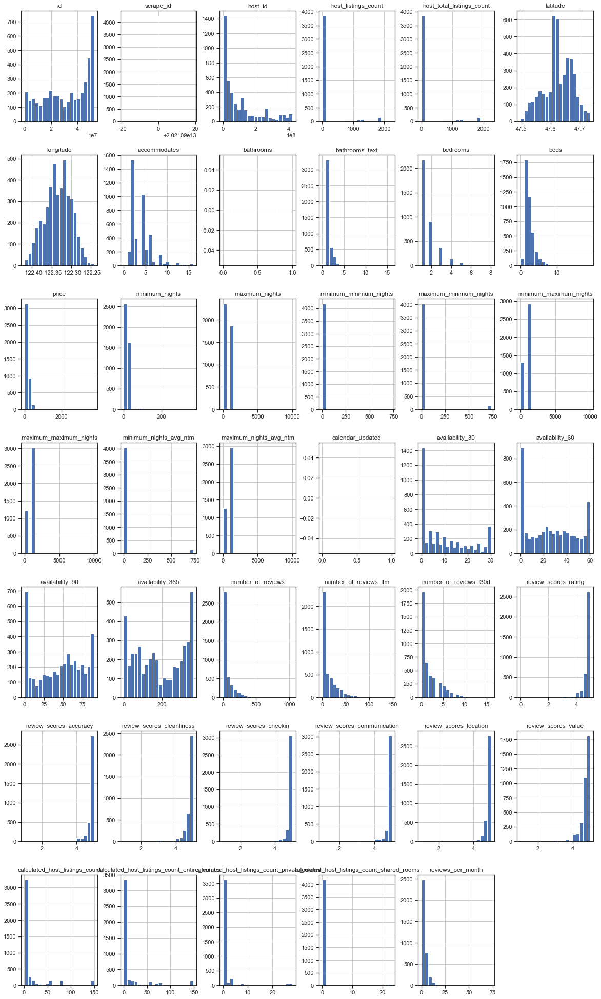

In [32]:
listing_dataset.hist(bins=20, figsize=(20,35))
plt.show()

The Histogtam gives a visual representation of all the numeric data in the dataset. For example for all of the reviews columns in the dataset, majority of the scores all seem to be above 4, which suggests that the ratings for airbnbs in seattle generally tend to be good. Another Example would be for bathrooms which we can see that most of the airbnbs have less than 5 bathrooms, which makes sense as having more than 5 bathrooms would be strange, this is another benefit to visualise using a histogram as we can quickly look through the graphs and make sense of the data. If we see anything unusual we can then proceed to process more about that data.

<AxesSubplot:>

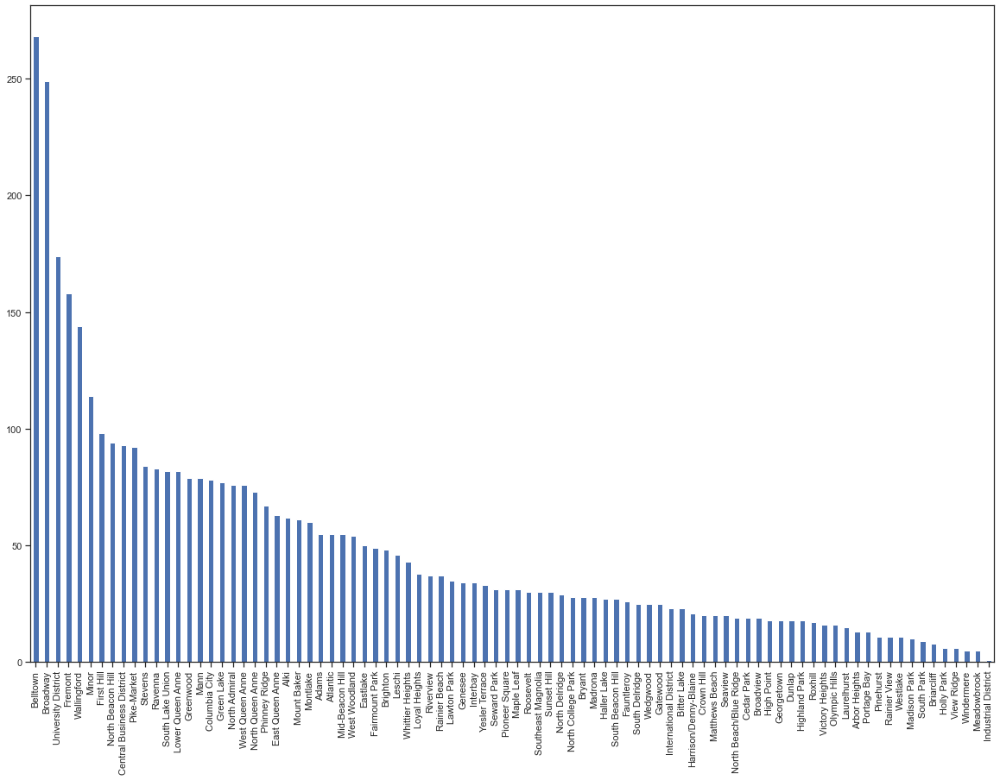

In [33]:
n=listing_dataset["neighbourhood_cleansed"].value_counts()
n.plot(kind="bar", figsize=(20,14))

From looking at the bar chart we can see that the most common airbnb location in seattle is Belltown and the least common is the Industrial Disctrict. 

<AxesSubplot:ylabel='room_type'>

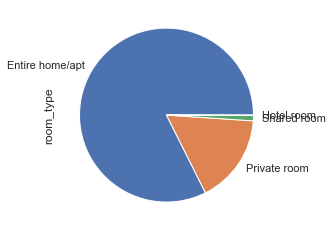

In [34]:
rt=listing_dataset["room_type"].value_counts()
rt.plot(kind="pie")

From looking at the pie chart we can see that the most common room type in seattle is Entire home/apt and the least common is the hotel room. 

<AxesSubplot:>

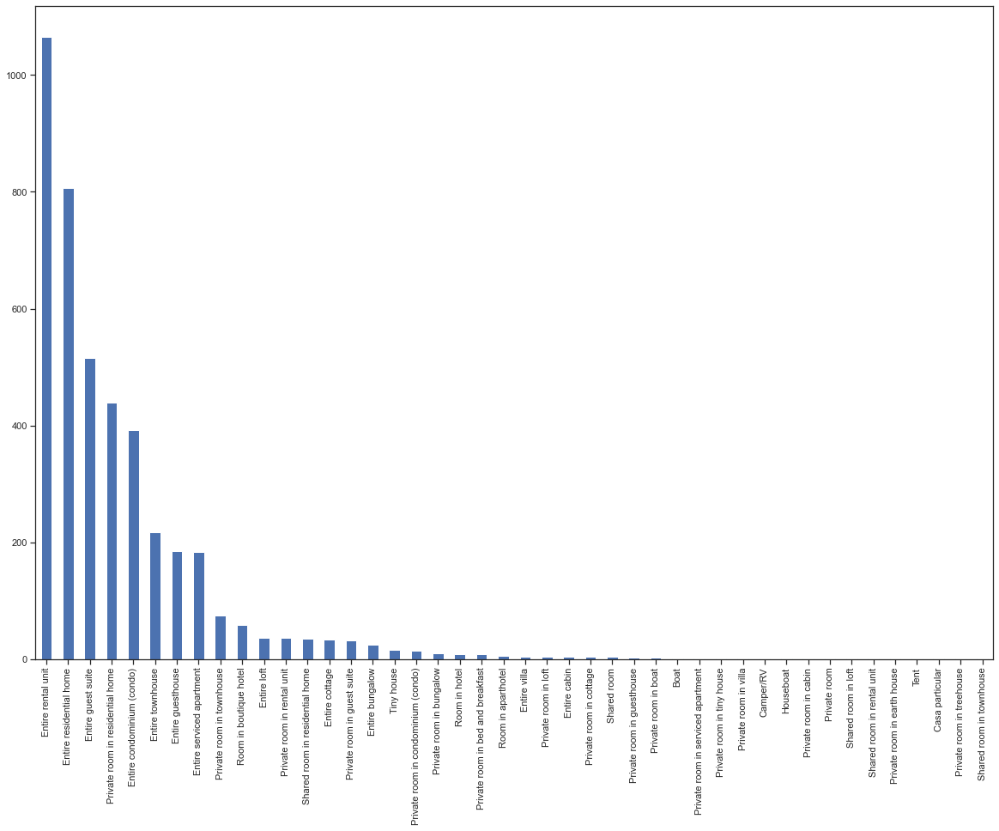

In [35]:
pt=listing_dataset["property_type"].value_counts()
pt.plot(kind="bar", figsize=(20,14))

In [36]:
listing_dataset["price"].value_counts()


100.0     80
125.0     63
90.0      61
85.0      58
150.0     56
120.0     54
75.0      53
70.0      51
50.0      50
99.0      49
80.0      47
140.0     44
250.0     43
95.0      43
200.0     42
89.0      40
115.0     38
135.0     38
130.0     36
79.0      35
110.0     34
119.0     33
145.0     31
149.0     31
157.0     31
60.0      29
175.0     29
180.0     29
126.0     29
96.0      28
139.0     28
98.0      27
84.0      26
160.0     26
109.0     26
91.0      26
65.0      25
116.0     25
111.0     25
131.0     24
141.0     24
132.0     24
128.0     24
129.0     24
92.0      23
88.0      22
86.0      22
93.0      22
104.0     22
165.0     21
159.0     21
170.0     21
166.0     21
97.0      20
101.0     20
148.0     20
123.0     20
40.0      20
134.0     20
72.0      20
105.0     20
161.0     19
195.0     19
103.0     19
155.0     19
55.0      19
146.0     19
76.0      19
169.0     19
171.0     19
144.0     18
87.0      18
124.0     18
106.0     18
83.0      18
164.0     18
114.0     18

<AxesSubplot:>

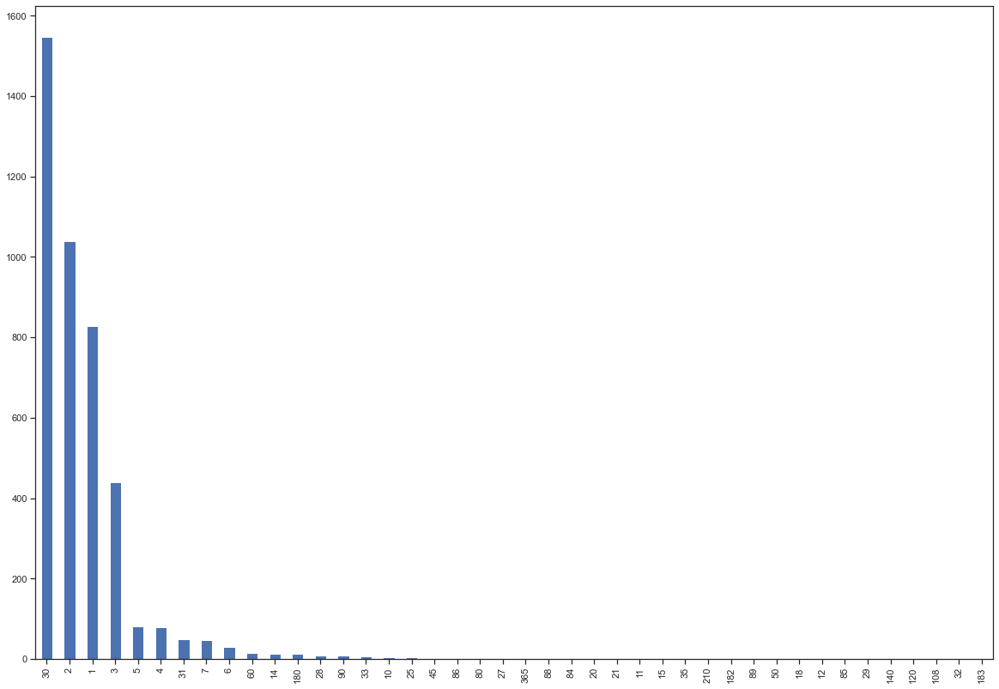

In [37]:
mn=listing_dataset["minimum_nights"].value_counts()
mn.plot(kind="bar", figsize=(20,14))

In [38]:
listing_dataset["number_of_reviews"].value_counts()


0       652
1       209
2       132
3       100
4       100
6        94
8        74
5        68
7        64
10       61
9        53
11       52
15       50
13       50
12       49
17       45
16       40
21       40
18       38
14       37
19       34
31       33
24       32
43       32
39       31
25       30
28       30
27       30
23       30
22       29
30       29
20       29
32       27
33       26
34       26
29       26
48       26
35       25
45       24
26       23
52       23
40       22
38       20
44       20
41       18
54       18
58       18
36       17
85       17
62       17
61       16
42       16
66       16
47       16
49       15
50       15
77       14
75       14
55       14
46       13
72       13
98       13
118      13
37       13
65       13
59       13
53       12
88       12
104      12
71       12
70       12
56       12
81       12
84       11
99       11
73       11
92       11
93       11
117      11
133      11
63       11
68       11
83       11
115 

In [39]:
listing_dataset["reviews_per_month"].value_counts()


1.00     98
2.00     36
0.08     30
3.00     28
0.18     25
0.05     21
0.21     21
0.32     21
0.42     19
0.26     17
0.55     17
0.47     17
0.20     16
0.41     16
0.25     16
0.14     15
0.53     14
0.63     14
0.38     14
0.09     13
0.15     13
0.40     13
0.34     13
1.43     13
0.17     13
6.00     13
0.31     13
0.10     12
0.44     12
0.60     12
1.41     12
4.00     12
0.16     12
1.34     12
0.76     12
0.12     12
0.19     12
0.23     11
0.22     11
0.66     11
1.03     11
1.05     11
1.38     11
0.59     11
2.14     11
0.50     11
5.00     11
0.64     11
0.45     11
0.51     11
0.36     11
0.11     10
1.42     10
0.72     10
1.48     10
0.75     10
0.35     10
0.39     10
0.84     10
3.29     10
0.61     10
0.07     10
0.43     10
0.69     10
1.07     10
1.95     10
1.84     10
0.27     10
1.46     10
1.22     10
1.99      9
1.37      9
1.09      9
3.24      9
2.50      9
0.33      9
2.01      9
1.30      9
1.55      9
0.48      9
0.93      9
2.70      9
0.62      9
0.29

<AxesSubplot:>

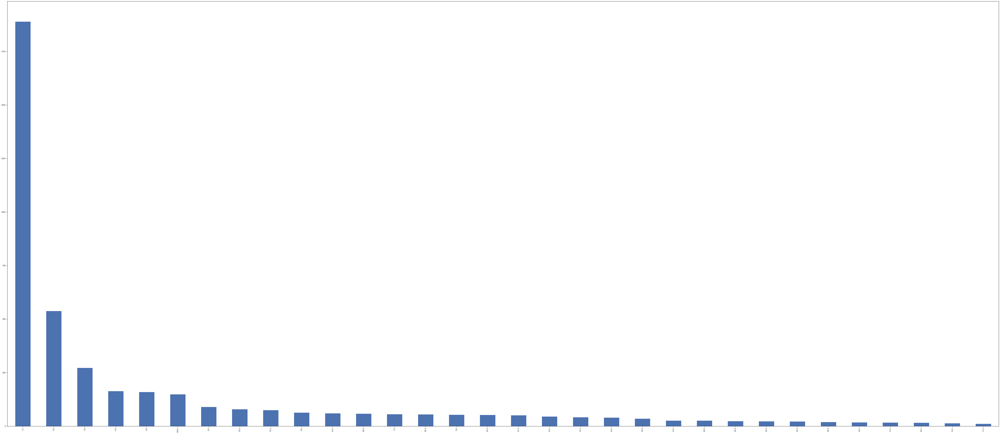

In [33]:
chlc=listing_dataset["calculated_host_listings_count"].value_counts()
chlc.plot(kind="bar",figsize=(100,44))

In [34]:
listing_dataset["availability_365"].value_counts()


0      214
365    199
364     52
328     42
359     33
267     33
1       33
363     28
329     28
23      27
82      27
349     24
53      23
180     23
316     23
325     22
145     22
358     22
355     22
2       22
151     21
331     20
143     20
337     20
73      20
335     20
350     19
298     19
148     19
74      19
4       19
332     19
336     19
333     18
54      18
62      18
65      18
116     18
90      18
89      18
64      18
165     17
351     17
360     17
327     17
5       17
342     17
268     17
84      17
153     17
236     16
159     16
357     16
345     16
48      16
322     16
309     16
321     16
150     16
117     16
354     16
46      16
319     16
33      16
79      15
61      15
344     15
356     15
146     15
43      15
72      15
85      15
289     15
318     15
51      15
76      15
306     15
87      15
3       15
83      15
208     15
353     15
348     15
57      14
49      14
59      14
237     14
338     14
121     14
340     14
299     14

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

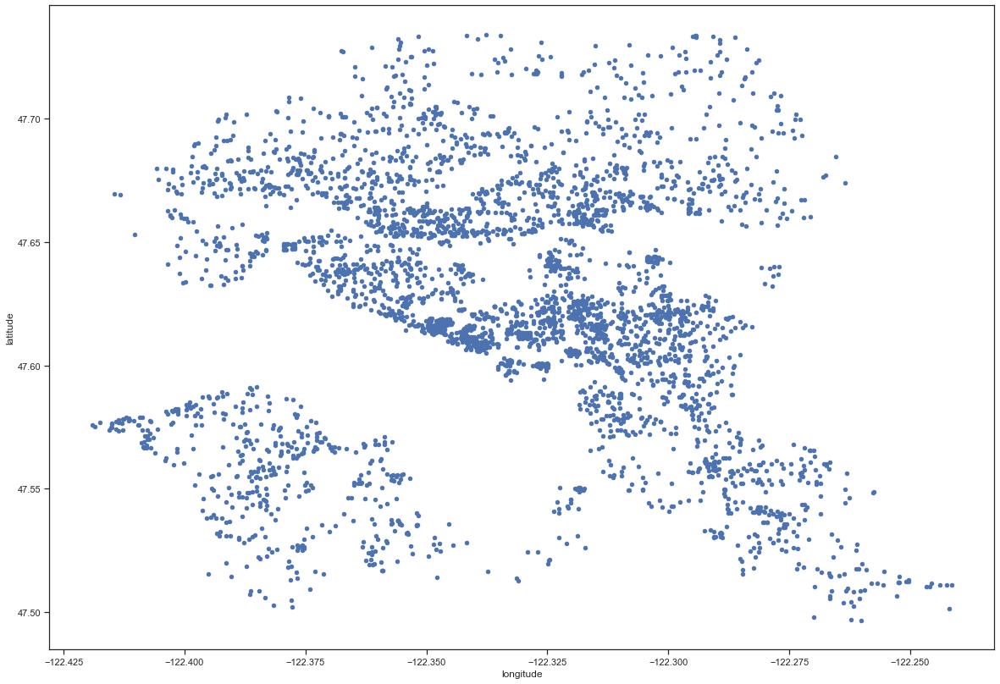

In [35]:
listing_dataset.plot(kind="scatter", x="longitude", y="latitude", figsize=(20,14))

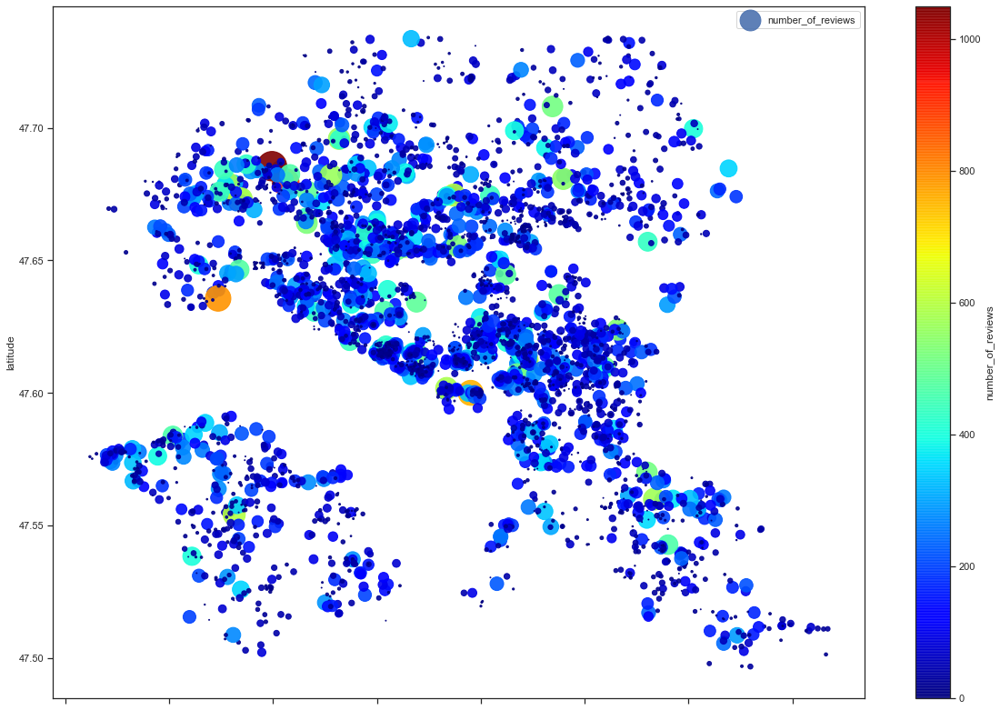

In [36]:
listing_dataset.plot(kind="scatter", x="longitude", y="latitude", alpha=0.9,
    s=listing_dataset["number_of_reviews"], label="number_of_reviews", figsize=(20,14),
    c="number_of_reviews",cmap=plt.get_cmap("jet"), colorbar=True,
)
plt.legend()

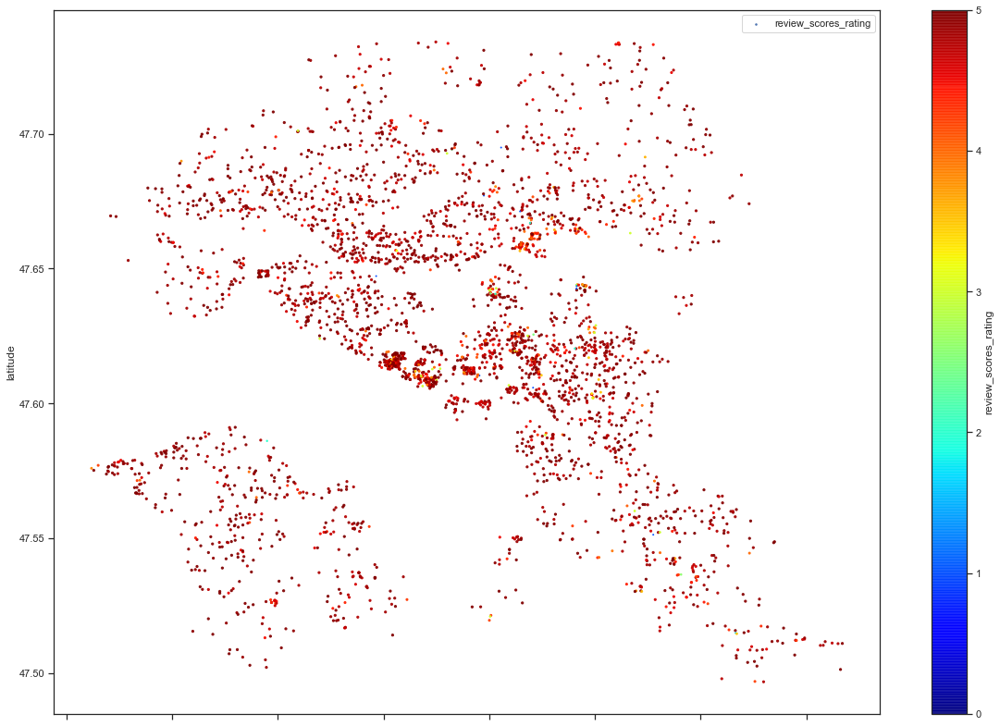

In [37]:
listing_dataset.plot(kind="scatter", x="longitude", y="latitude", alpha=0.9,
    s=listing_dataset["review_scores_rating"], label="review_scores_rating", figsize=(20,14),
    c="review_scores_rating",cmap=plt.get_cmap("jet"), colorbar=True,
)
plt.legend()

NameError: name 'ax' is not defined

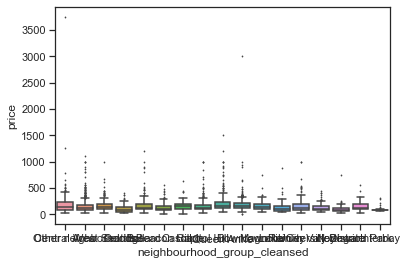

In [38]:
ngc = sns.boxplot(data=listing_dataset, x='neighbourhood_group_cleansed', y='price', fliersize=0.9)
ngc.set_xticklabels(ax.get_xticklabels(), rotation=90)
ngc.set_ylim(0, 400);

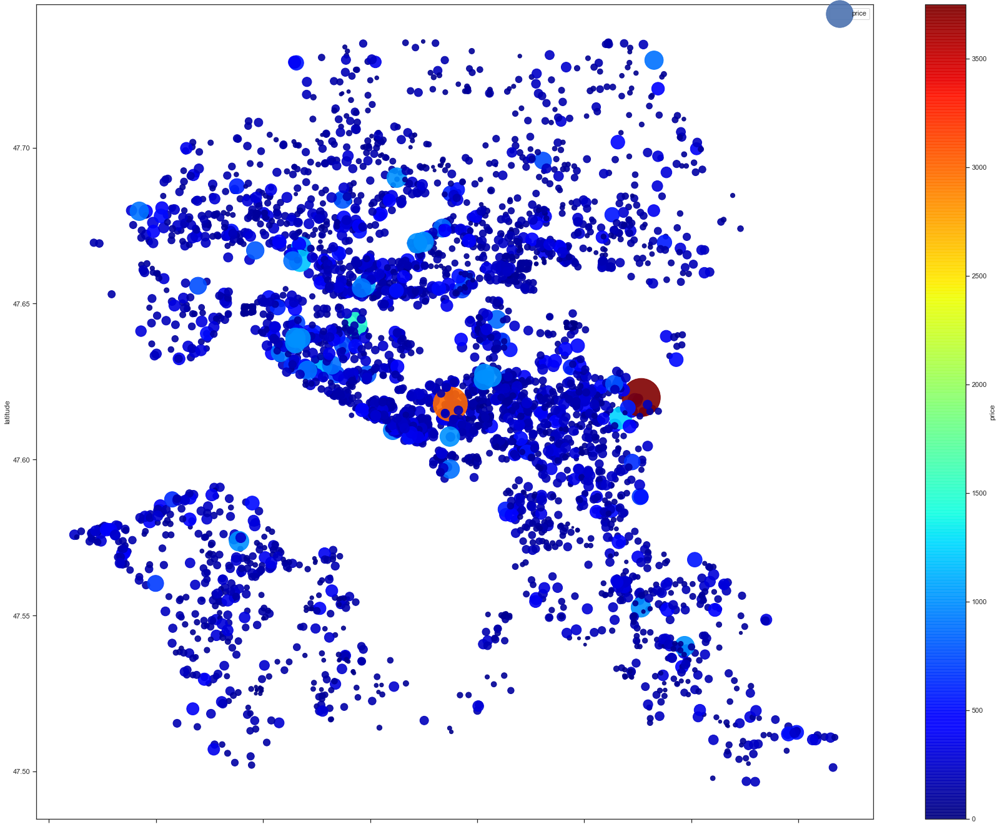

In [39]:
listing_dataset.plot(kind="scatter", x="longitude", y="latitude", alpha=0.9,
    s=listing_dataset["price"], label="price", figsize=(30,24),
    c="price",cmap=plt.get_cmap("jet"), colorbar=True,
)
plt.legend()


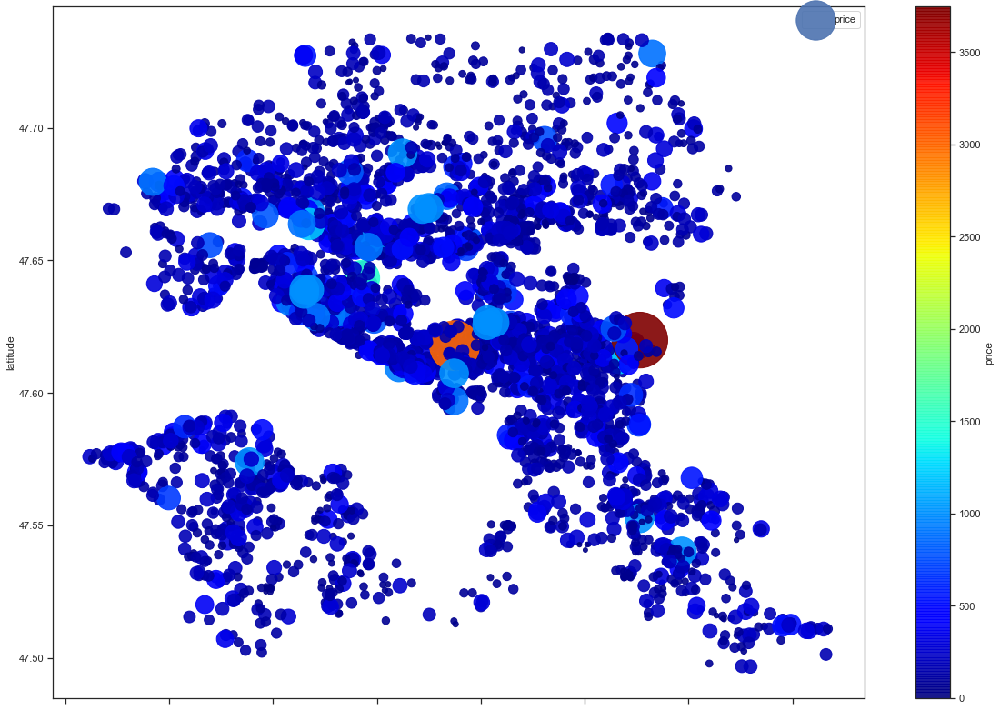

In [40]:
listing_dataset.plot(kind="scatter", x="longitude", y="latitude", alpha=0.9,
    s=listing_dataset["price"], label="price", figsize=(20,14),
    c="price",cmap=plt.get_cmap("jet"), colorbar=True,
)
plt.legend()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


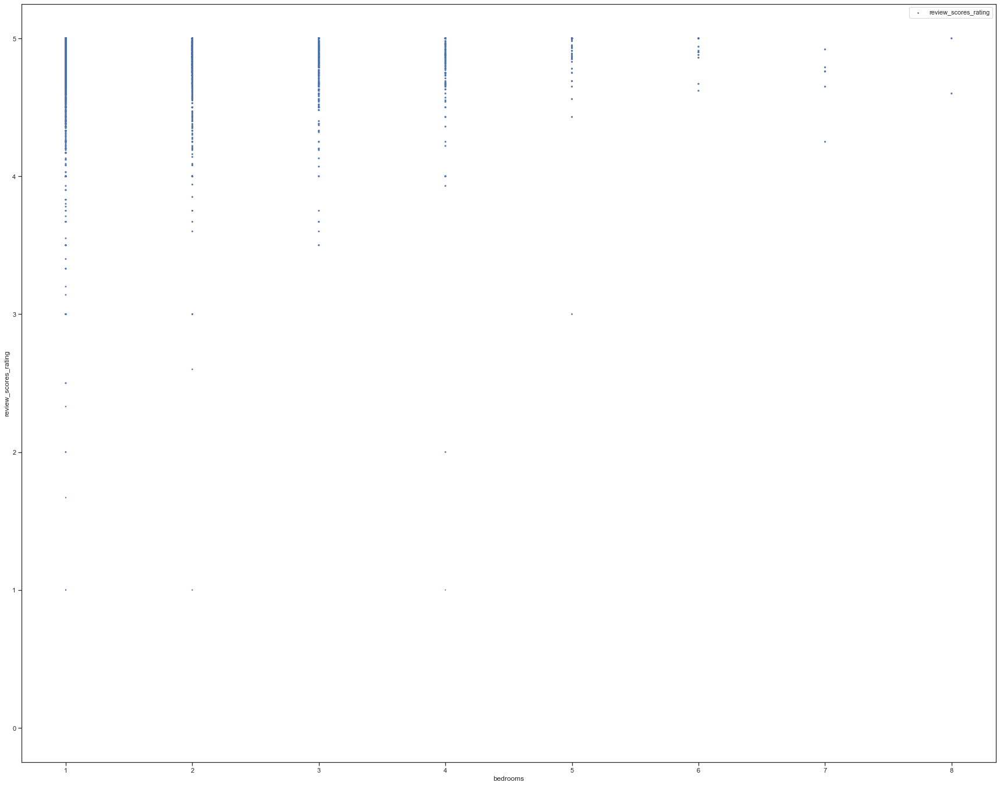

In [41]:
listing_dataset.plot(kind="scatter", x="bedrooms", y="review_scores_rating", alpha=1,
    s=listing_dataset["review_scores_rating"], label="review_scores_rating", figsize=(30,24),
)
plt.legend()


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


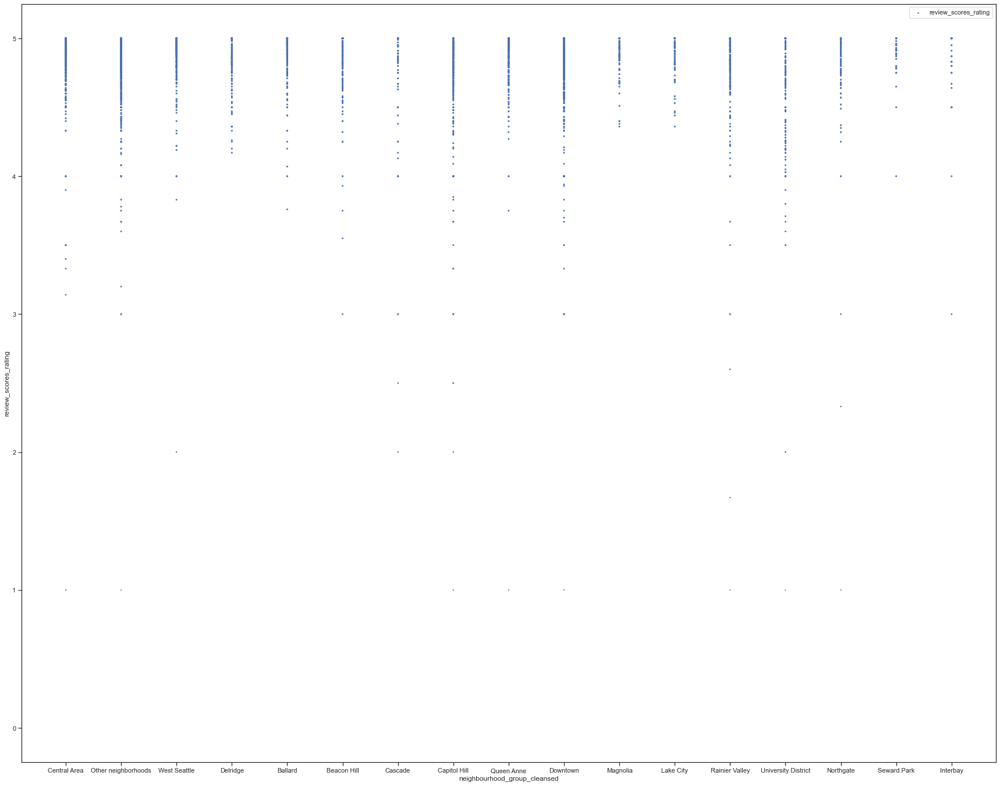

In [42]:
listing_dataset.plot(kind="scatter", x="neighbourhood_group_cleansed", y="review_scores_rating", alpha=1,
    s=listing_dataset["review_scores_rating"], label="review_scores_rating", figsize=(30,24),
)
plt.legend()

# Feature Engineering

## Experimenting with Attribute Combinations

In [43]:
#listing_df3["rooms_per_household"] = listing_df3["total_rooms"]+listing_df3["households"]
#listing_df3["bedrooms_per_room"] = listing_df3["total_bedrooms"]/listing_df3["total_rooms"]
#listing_df3["population_per_household"]=listing_df3["population"]/listing_df3["households

In [44]:
corr_matrix = listing_df3.corr() # computes the standard correlation coefficient (Pearson’s r) between every pair of attributes
corr_matrix["price"].sort_values(ascending=False)

price                                                1.000000
bedrooms                                             0.635259
accommodates                                         0.615051
beds                                                 0.558952
bathrooms_text                                       0.541549
property_type_Entire residential home                0.386751
property_type_Entire townhouse                       0.169083
neighbourhood_group_cleansed_Queen Anne              0.138513
availability_30                                      0.114986
review_scores_location                               0.114288
property_type_Entire villa                           0.103592
review_scores_rating                                 0.096744
availability_60                                      0.087913
review_scores_cleanliness                            0.086359
property_type_Private room in boat                   0.071404
neighbourhood_group_cleansed_Downtown                0.066713
availabi

# Prepare the Data for Machine Learning Algorithms

In [45]:
#Dropping Price 
listing_df4 = listing_df3.drop("price", axis=1) 


In [46]:
listing_df3.describe()

,id,latitude,longitude,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,neighbourhood_group_cleansed_Beacon Hill,neighbourhood_group_cleansed_Capitol Hill,neighbourhood_group_cleansed_Cascade,neighbourhood_group_cleansed_Central Area,neighbourhood_group_cleansed_Delridge,neighbourhood_group_cleansed_Downtown,neighbourhood_group_cleansed_Interbay,neighbourhood_group_cleansed_Lake City,neighbourhood_group_cleansed_Magnolia,neighbourhood_group_cleansed_Northgate,neighbourhood_group_cleansed_Other neighborhoods,neighbourhood_group_cleansed_Queen Anne,neighbourhood_group_cleansed_Rainier Valley,neighbourhood_group_cleansed_Seward Park,neighbourhood_group_cleansed_University District,neighbourhood_group_cleansed_West Seattle,property_type_Camper/RV,property_type_Casa particular,property_type_Entire bungalow,property_type_Entire cabin,property_type_Entire condominium (condo),property_type_Entire cottage,property_type_Entire guest suite,property_type_Entire guesthouse,property_type_Entire loft,property_type_Entire rental unit,property_type_Entire residential home,property_type_Entire serviced apartment,property_type_Entire townhouse,property_type_Entire villa,property_type_Houseboat,property_type_Private room,property_type_Private room in bed and breakfast,property_type_Private room in boat,property_type_Private room in bungalow,property_type_Private room in cabin,property_type_Private room in condominium (condo),property_type_Private room in cottage,property_type_Private room in earth house,property_type_Private room in guest suite,property_type_Private room in guesthouse,property_type_Private room in loft,property_type_Private room in rental unit,property_type_Private room in residential home,property_type_Private room in serviced apartment,property_type_Private room in tiny house,property_type_Private room in townhouse,property_type_Private room in treehouse,property_type_Private room in villa,property_type_Room in aparthotel,property_type_Room in boutique hotel,property_type_Room in hotel,property_type_Shared room,property_type_Shared room in residential home,property_type_Shared room in townhouse,property_type_Tent,property_type_Tiny house,room_type_Private room,room_type_Shared room,instant_bookable_t
count,3.087000e+03,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.000000,3087.00000

In [47]:
listing_df3["price_bins"] = pd.cut(listing_df3["price"],
                               bins=[0,200,400,600,800,1000,1200,1400,1600,1800, np.inf],
                               labels=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
listing_df3["price_bins"].astype(int)

0       3
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
12      1
13      1
14      1
15      1
16      1
17      1
18      2
19      4
20      2
21      1
22      2
23      1
24      1
25      1
26      1
27      2
28      1
29      1
30      1
31      1
32      3
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      2
42      1
43      3
44      1
45      1
46      1
47      1
48      1
49      2
50      1
51      1
52      1
53      1
54      1
55      2
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      2
65      2
66      1
67      1
68      1
69      1
70      1
71      2
72      1
73      2
74      1
75      1
76      1
77      1
78      1
79      2
80      1
81      1
82      3
84      2
85      1
86      2
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      2
96      1
97      1
98      1
99      1
100     1
101     1
102     1


In [48]:
listing_df3["price_bins"].value_counts()

1     2358
2      608
3       86
4       19
5       12
6        2
7        1
8        1
9        0
10       0
Name: price_bins, dtype: int64

<AxesSubplot:>

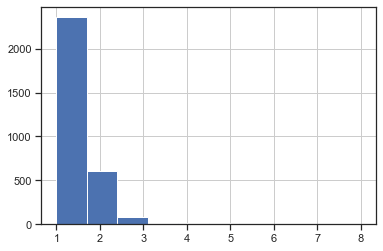

In [49]:
listing_df3["price_bins"].hist()

In [50]:
listing_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3087 entries, 0 to 4220
Data columns (total 96 columns):
 #   Column                                             Non-Null Count  Dtype   
---  ------                                             --------------  -----   
 0   id                                                 3087 non-null   int64   
 1   latitude                                           3087 non-null   float64 
 2   longitude                                          3087 non-null   float64 
 3   accommodates                                       3087 non-null   int64   
 4   bathrooms_text                                     3087 non-null   float64 
 5   bedrooms                                           3087 non-null   float64 
 6   beds                                               3087 non-null   float64 
 7   price                                              3087 non-null   float64 
 8   minimum_nights                                     3087 non-null   int64   
 9

# Modelling & Evaluation

### Processed Dataset

In [51]:
X_df = listing_df4



In [52]:
y_df = listing_df3['price_bins']
y=y_df.values
#y=np.ravel(y_df)

print(X_df.shape)

print(y.shape)

(3087, 94)
(3087,)


In [53]:
#from sklearn import preprocessing
#le = preprocessing.LabelEncoder()
#y=le.fit_transform(y)
#print(y.dtype)
#print(y.shape)

In [54]:
from sklearn.naive_bayes import GaussianNB
nv = GaussianNB() # create a classifier
nv.fit(X_df,y) # fitting the data

GaussianNB()

In [55]:
from sklearn.metrics import accuracy_score
y_pred = nv.predict(X_df) # store the prediction data
accuracy_score(y,y_pred) # calculate the accuracy


0.7648202137998056

In [56]:
y.dtype

CategoricalDtype(categories=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10], ordered=True)

In [57]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y, y_pred,labels=[1,2,3,4,5,6,7,8,9,10]))


[[2358    0    0    0    0    0    0    0    0    0]
 [ 607    1    0    0    0    0    0    0    0    0]
 [  86    0    0    0    0    0    0    0    0    0]
 [  19    0    0    0    0    0    0    0    0    0]
 [  12    0    0    0    0    0    0    0    0    0]
 [   2    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    1    0    0    0]
 [   0    0    0    0    0    0    0    1    0    0]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0]]


In [58]:

diff = [u for u in y if u not in y_pred]
len(diff)

119

In [59]:
from sklearn.metrics import classification_report

print(classification_report(y, y_pred))#,target_names=[1,2,3,4,5,6,7,8,9,10]))

              precision    recall  f1-score   support

           1       0.76      1.00      0.87      2358
           2       1.00      0.00      0.00       608
           3       0.00      0.00      0.00        86
           4       0.00      0.00      0.00        19
           5       0.00      0.00      0.00        12
           6       0.00      0.00      0.00         2
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1

    accuracy                           0.76      3087
   macro avg       0.47      0.38      0.36      3087
weighted avg       0.78      0.76      0.66      3087



/Users/adithyasripada/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adithyasripada/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/adithyasripada/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r

In [60]:
y_pred_prob = nv.predict_proba(X_df)[:,1]

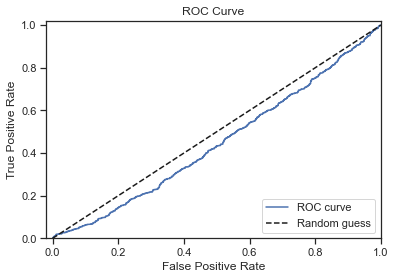

In [61]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
%matplotlib inline

fpr, tpr, thresholds = roc_curve(y, y_pred_prob, pos_label=1)
# create plot
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
_ = plt.xlabel('False Positive Rate')
_ = plt.ylabel('True Positive Rate')
_ = plt.title('ROC Curve')
_ = plt.xlim([-0.02, 1])
_ = plt.ylim([0, 1.02])
_ = plt.legend(loc="lower right")

### Dataset 1

In [62]:
review_df = listing_df3[['number_of_reviews',
        'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']]

In [63]:
review_df

,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,35,4.97,5.00,5.00,5.00,5.00,4.97,4.82
1,157,4.60,4.67,4.67,4.82,4.76,4.88,4.56
2,153,4.67,4.75,4.72,4.92,4.89,4.65,4.62
3,49,4.96,4.98,4.96,4.98,4.94,4.98,4.88
4,58,4.98,4.98,4.98,5.00,4.98,4.95,4.93
5,77,4.81,4.88,4.88,4.94,4.95,4.85,4.82
6,43,4.36,4.27,3.87,4.83,4.73,4.37,4.47
7,25,4.50,4.46,3.92,4.79,4.79,4.33,4.52
8,877,4.92,4.92,4.92,4.98,4.98,4.90,4.90
9,97,4.25,4.31,3.57,4.76,4.75,4.73,4.34


In [64]:
# Now we will look at the correlation of all the attributes with the expected class attribute (median-house-value)
corr_matrix = review_df.corr() # computes the standard correlation coefficient (Pearson’s r) between every pair of attributes
corr_matrix["review_scores_rating"].sort_values(ascending=False)

review_scores_rating           1.000000
review_scores_accuracy         0.814324
review_scores_value            0.797925
review_scores_cleanliness      0.786535
review_scores_communication    0.738811
review_scores_checkin          0.612579
review_scores_location         0.554741
number_of_reviews              0.143357
Name: review_scores_rating, dtype: float64

In [65]:
#Dropping Price 
review_df1 = review_df.drop("review_scores_rating", axis=1) 

In [73]:
review_df1["review_score_bin"] = pd.cut(review_df["review_scores_rating"],
                               bins=[-0.5, 0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5 ],
                               labels=[0,1, 2, 3, 4, 5, 6, 7, 8, 9, 10,11])
No_NaN_review_df=review_df1.dropna(axis=0)
No_NaN_review_df["review_score_bin"]=No_NaN_review_df["review_score_bin"].astype(int)

In [74]:
print(review_df1.shape)

print(No_NaN_review_df["review_score_bin"].shape)

(3087, 8)
(3087,)


In [75]:
clf = GaussianNB()
clf.fit(review_df1, No_NaN_review_df["review_score_bin"])


GaussianNB()

In [76]:
X_rdf = review_df1

In [77]:
y_df1 = No_NaN_review_df["review_score_bin"]
y1=y_df1.values
#y=np.ravel(y_df)

print(X_rdf.shape)

print(y1.shape)

(3087, 8)
(3087,)


In [78]:
clf = GaussianNB()
clf.fit(X_rdf,y1) # fitting the data

GaussianNB()

In [79]:
from sklearn.metrics import accuracy_score
y_pred1 = clf.predict(X_rdf) # store the prediction data
accuracy_score(y1, y_pred1) # calculate the accuracy


1.0

# Clustering


This section of the notebook I will using Scikit-Learn functions to run and explore the  K-Means clustering algorithms, Evaluate the clustering results, Find the optimal number of clusters & Explore limitations  of K-Means.





## Trying to visually find value for K

Trying to created plots to see where I can see clustering.

In [86]:
listing_df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3087 entries, 0 to 4220
Data columns (total 39 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            3087 non-null   int64  
 1   neighbourhood_group_cleansed                  3087 non-null   object 
 2   latitude                                      3087 non-null   float64
 3   longitude                                     3087 non-null   float64
 4   property_type                                 3087 non-null   object 
 5   room_type                                     3087 non-null   object 
 6   accommodates                                  3087 non-null   int64  
 7   bathrooms_text                                3087 non-null   float64
 8   bedrooms                                      3087 non-null   float64
 9   beds                                          3087 non-null   f

In [107]:
LDF = listing_df2[['neighbourhood_group_cleansed',
       'latitude', 'longitude', 'property_type', 'room_type',
       'accommodates', 'bathrooms_text', 'bedrooms', 'beds',
        'price', 
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm','availability_365',
       'number_of_reviews','review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location', 'review_scores_value',
       'calculated_host_listings_count','reviews_per_month']]

In [114]:
LDFR = listing_df2[[ 'price', 'number_of_reviews','review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location', 'review_scores_value',]]

In [141]:
LDFP = listing_df2[[ 'price', 'review_scores_rating']]

In [142]:
LDFP = listing_df2[[ 'review_scores_communication', 'review_scores_rating']]

In [90]:
from sklearn.datasets import make_blobs


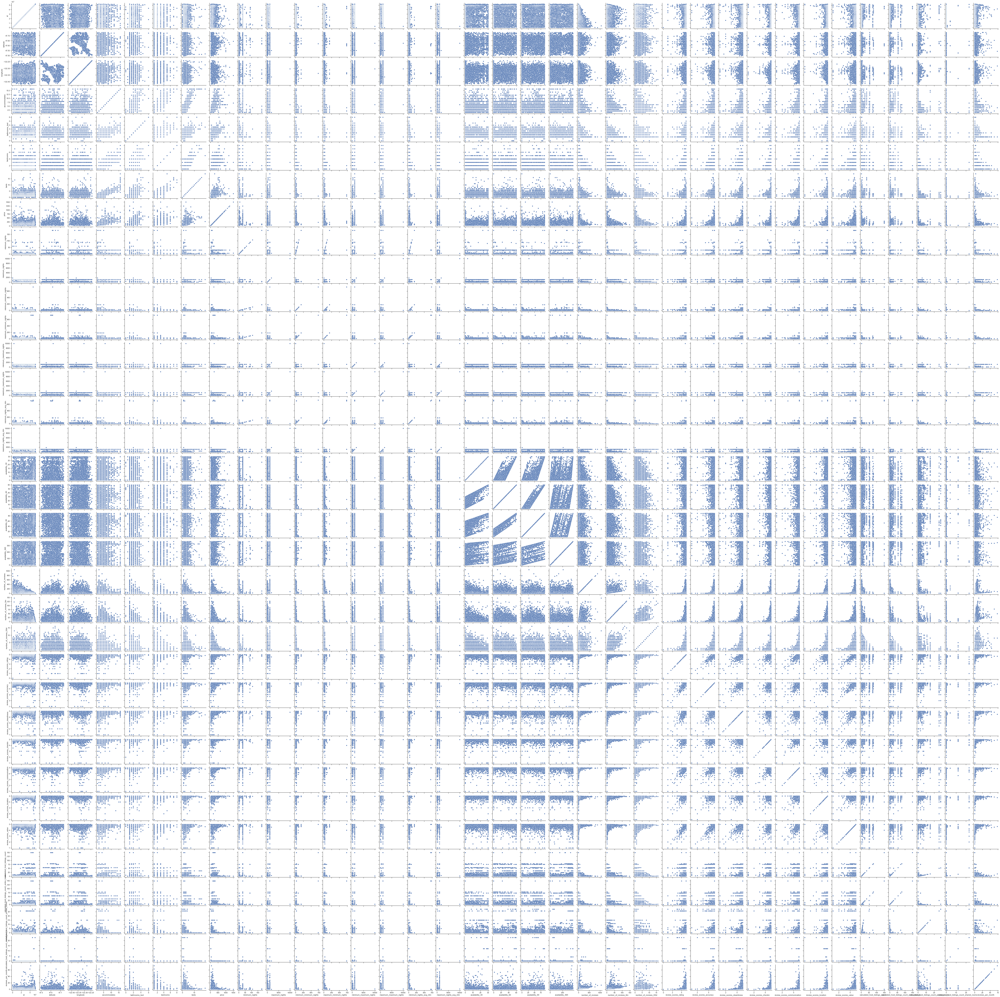

In [105]:
g = sns.PairGrid(listing_df2)
g.map(sns.scatterplot)

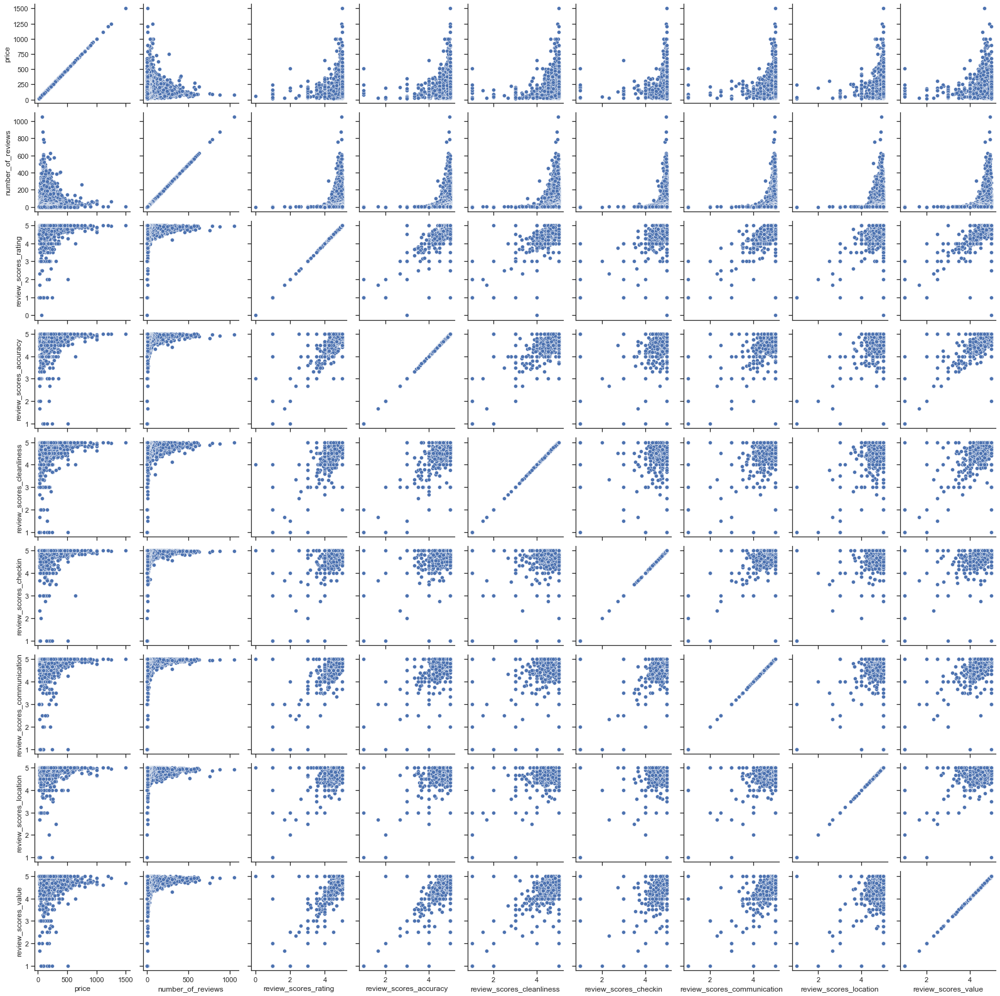

In [115]:
g = sns.PairGrid(LDFR)
g.map(sns.scatterplot)

## k-means

In [119]:
from sklearn.cluster import KMeans

In [143]:
k = 5
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(LDFP)

In [144]:
y_pred

array([0, 3, 3, ..., 0, 3, 0], dtype=int32)

In [145]:
y_pred is kmeans.labels_

True

In [146]:
kmeans.cluster_centers_

array([[4.96278169, 4.90928257],
       [4.1944186 , 4.08426357],
       [1.75533333, 1.76666667],
       [4.81899536, 4.57241113],
       [4.28583333, 2.65708333]])

In [147]:
kmeans.labels_

array([0, 3, 3, ..., 0, 3, 0], dtype=int32)

In [148]:
X_new = np.array([[0, 2], [3, 2], [-3, 3], [-3, 2.5]])
kmeans.predict(X_new)

array([2, 2, 2, 2], dtype=int32)

In [31]:
# def plot_data(X):
#     plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=30, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=50, linewidths=50,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

In [32]:
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, LDFP)
plt.show()

NameError: name 'kmeans' is not defined

<Figure size 576x288 with 0 Axes>